In [8]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision.models.detection.retinanet import RetinaNet, RetinaNetHead
from torchvision.models.detection.anchor_utils import AnchorGenerator
from torchvision.models.detection.image_list import ImageList
from torchvision.ops import boxes as box_ops
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.ops import box_iou
from tqdm import tqdm
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torch.cuda.amp import autocast, GradScaler

In [2]:
class YOLODataset(Dataset):
    def __init__(self, images_dir, labels_dir, transforms=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transforms = transforms
        self.images = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]
        self.labels = [f for f in os.listdir(labels_dir) if f.endswith('.txt') ]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.images[idx])
        label_path = os.path.join(self.labels_dir, os.path.splitext(self.images[idx])[0] + '.txt')
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img,(224,224))
        height, width, _ = img.shape

        boxes = []
        labels = []
        if os.path.exists(label_path):
            with open(label_path) as f:
                for line in f.readlines():
                    parts = line.strip().split()
                    # print(parts)
                    if len(parts) != 5:
                        continue  
                    class_id, cx, cy, w, h = map(float, parts)
                    if class_id >=12:
                        continue # skip invalid lines
                    x1 = (cx - w/2) * width
                    y1 = (cy - h/2) * height
                    x2 = (cx + w/2) * width
                    y2 = (cy + h/2) * height
                    if((cx>1 or cx<0) or (cy>1 or cy<0) or (w>1 or w<0) or (h>1 or h<0)):
                        continue;
                    if((abs(x1-x2)*abs(y1-y2))<=0):
                        continue;
                    boxes.append([x1, y1, x2, y2])
                    labels.append(int(class_id))

        target = {}
        target['path'] = label_path
        if boxes:
            target['boxes'] = torch.tensor(boxes, dtype=torch.float32)
            target['labels'] = torch.tensor(labels, dtype=torch.int64)
        else:
            target['boxes'] = torch.zeros((0, 4), dtype=torch.float32)
            target['labels'] = torch.zeros((0,), dtype=torch.int64)

        img = F.to_tensor(img)
        if self.transforms:
            img = self.transforms(img)

        return img, target


In [3]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [4]:
full_dataset = YOLODataset("/kaggle/input/test-retina/test/test",'/kaggle/input/test-retina/clean_label/clean_label')
train_size = int(0.8 * len(full_dataset))
test_size = len(full_dataset) - train_size
train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


/tmp/ipykernel_31/298955411.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(mappings))
/tmp/ipykernel_31/298955411.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We 

🔍 Predicting: 19666.jpg


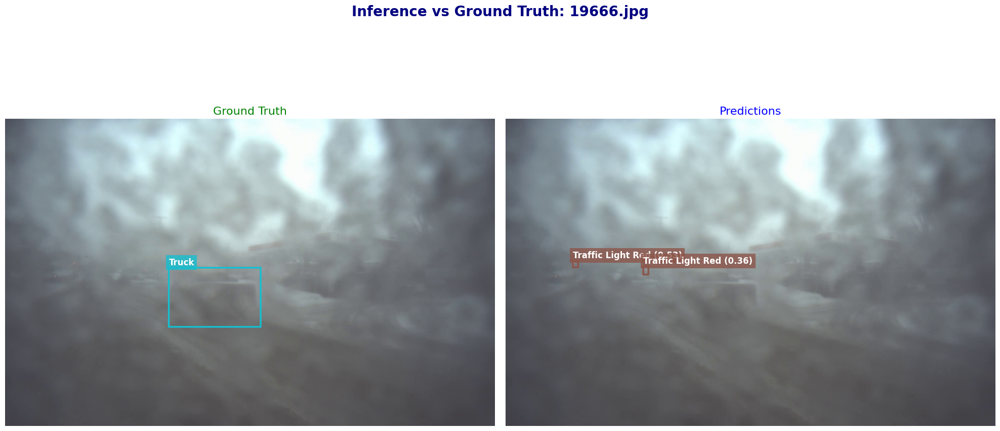

🔍 Predicting: 19330.jpg


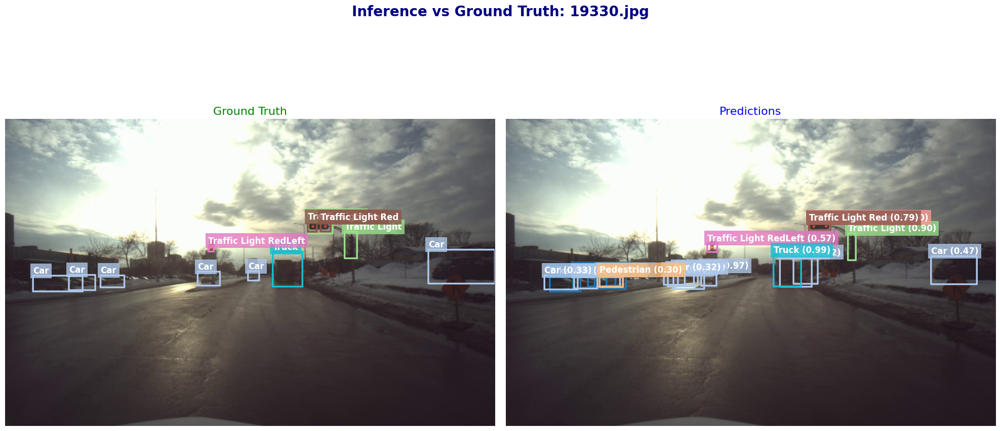

🔍 Predicting: 19544.jpg


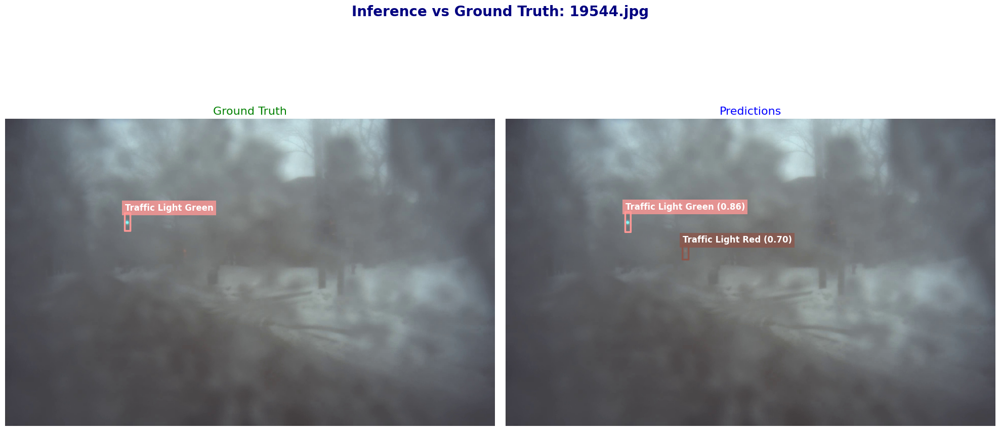

🔍 Predicting: 19410.jpg


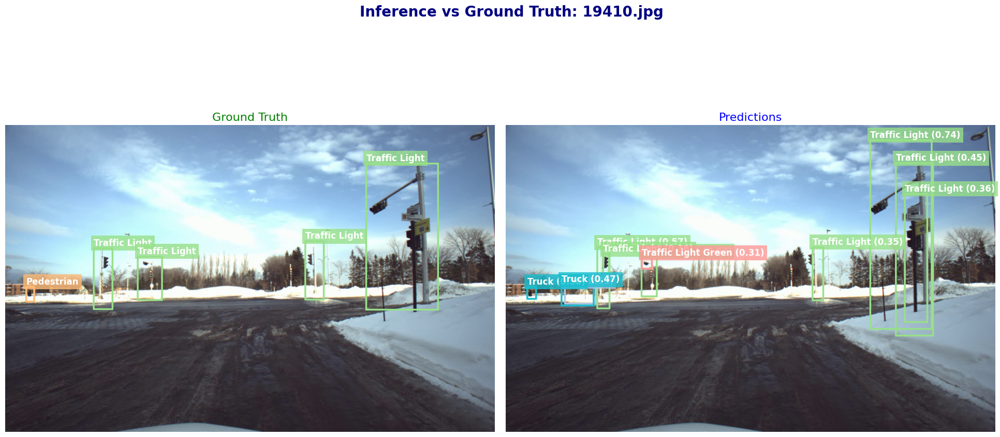

🔍 Predicting: 19541.jpg


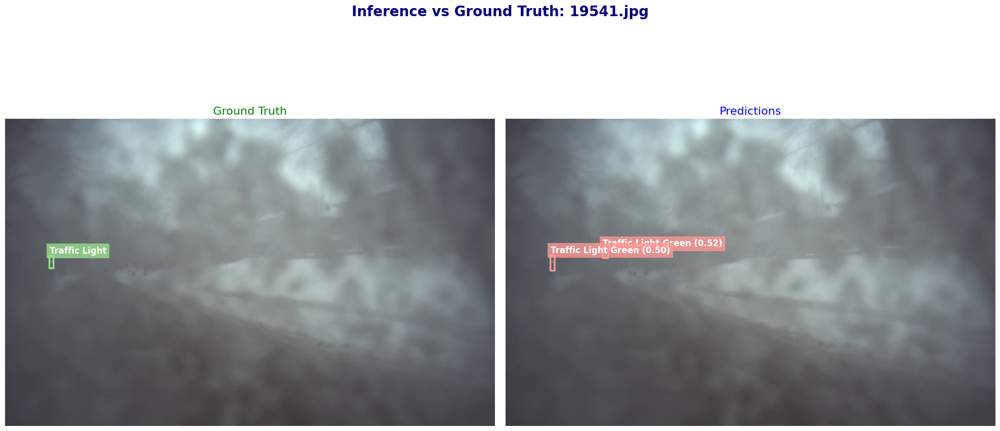

🔍 Predicting: 19315.jpg


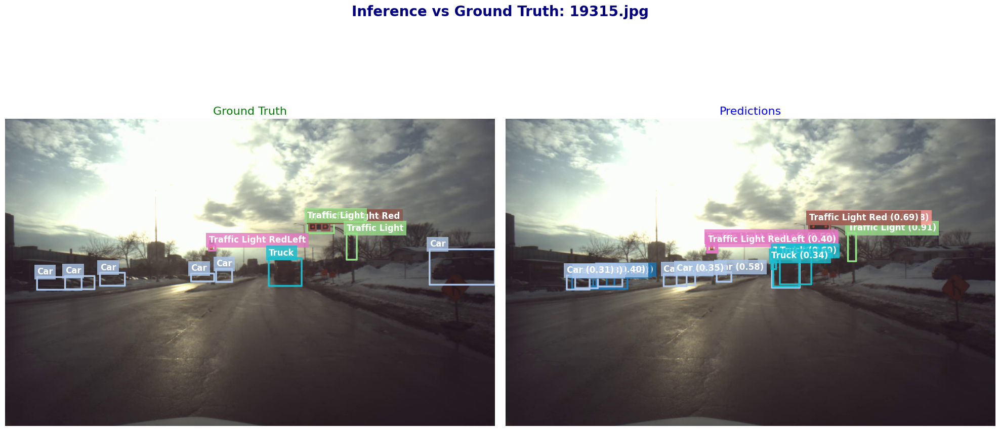

🔍 Predicting: 19305.jpg


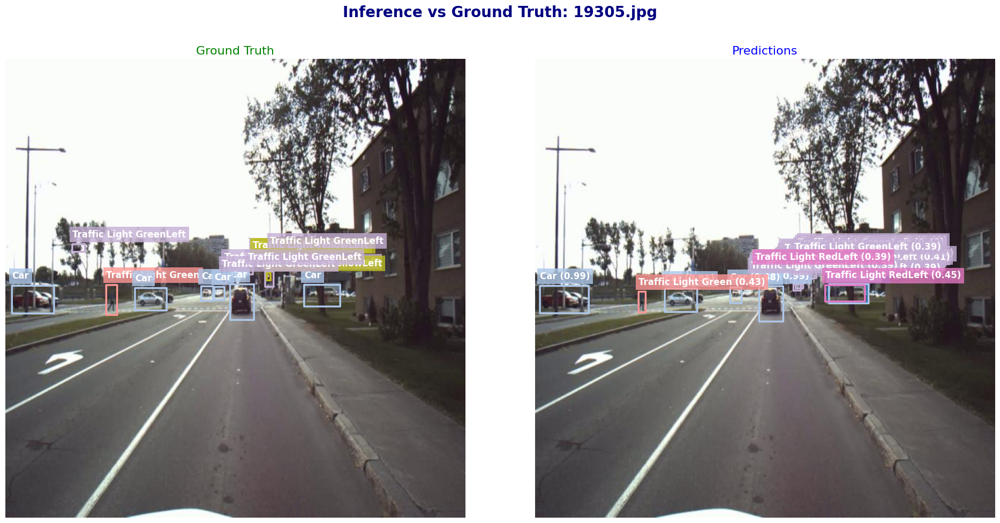

🔍 Predicting: 19686.jpg


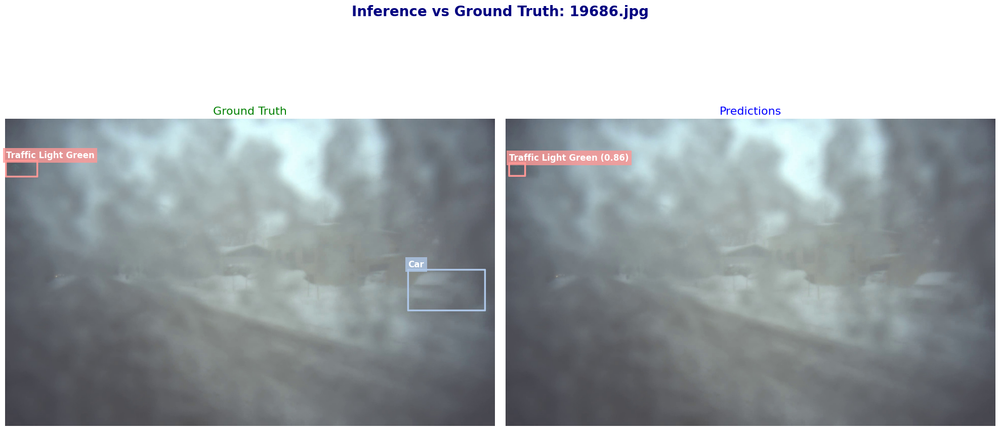

🔍 Predicting: 19646.jpg


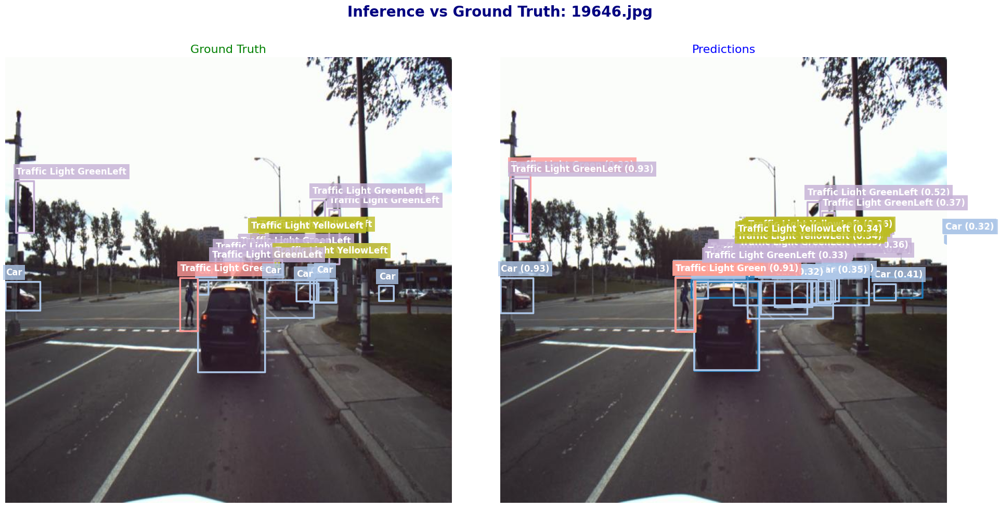

🔍 Predicting: 19665.jpg


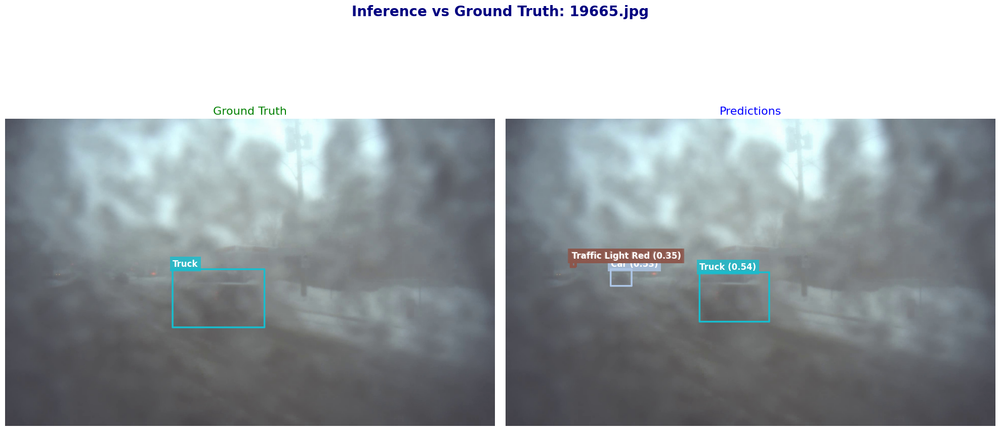

🔍 Predicting: 19391.jpg


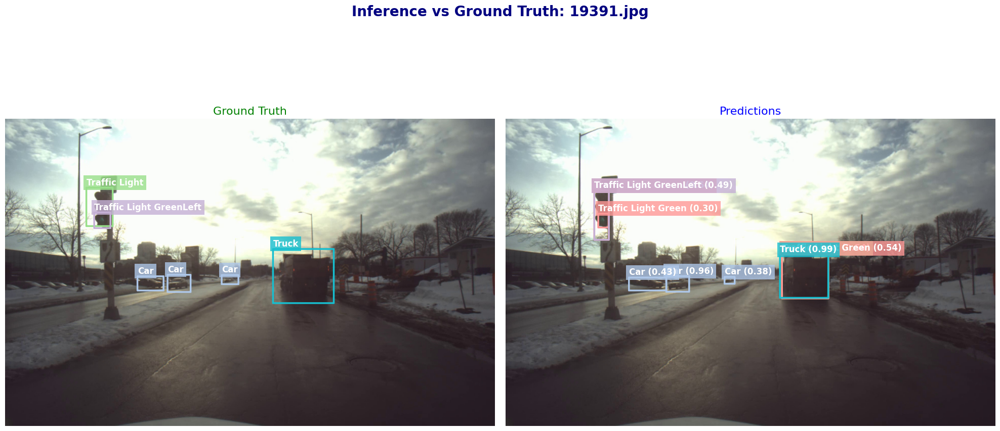

🔍 Predicting: 19472.jpg


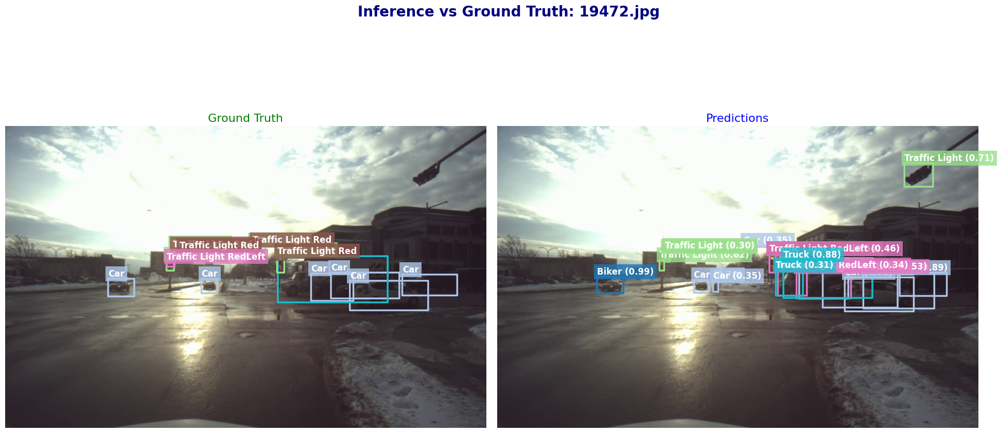

🔍 Predicting: 19641.jpg


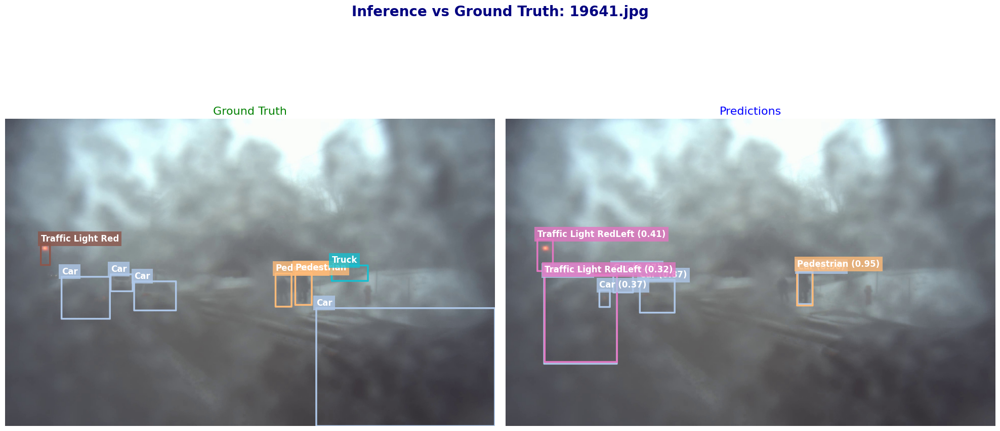

🔍 Predicting: 19590.jpg


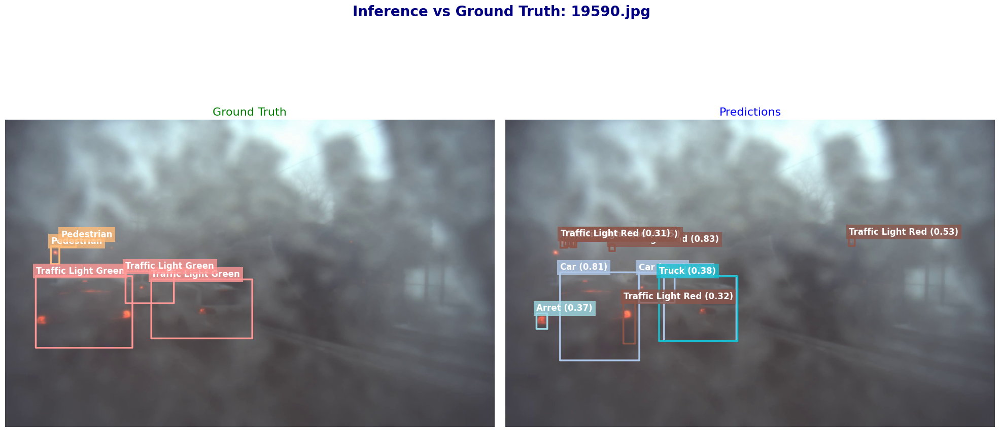

🔍 Predicting: 19396.jpg


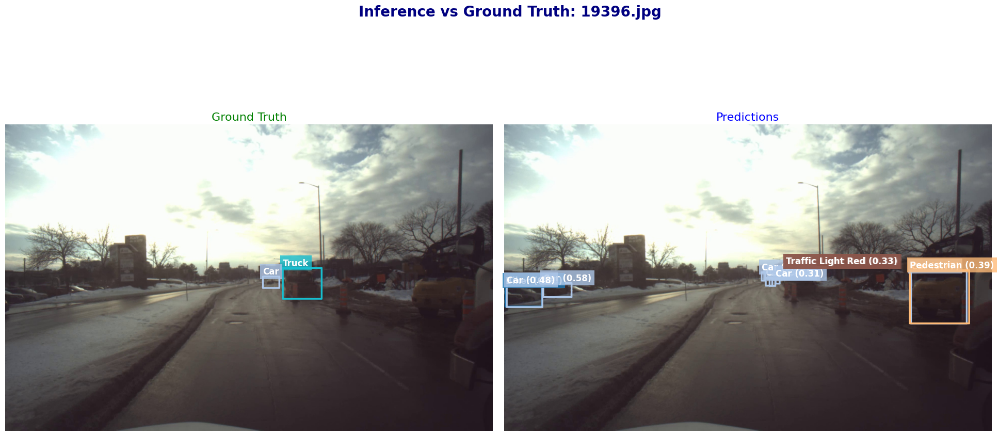

🔍 Predicting: 19463.jpg


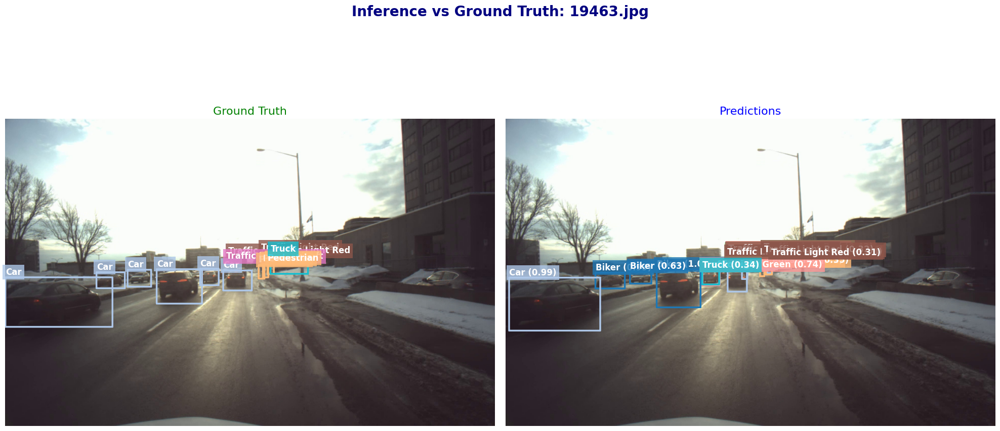

🔍 Predicting: 19688.jpg


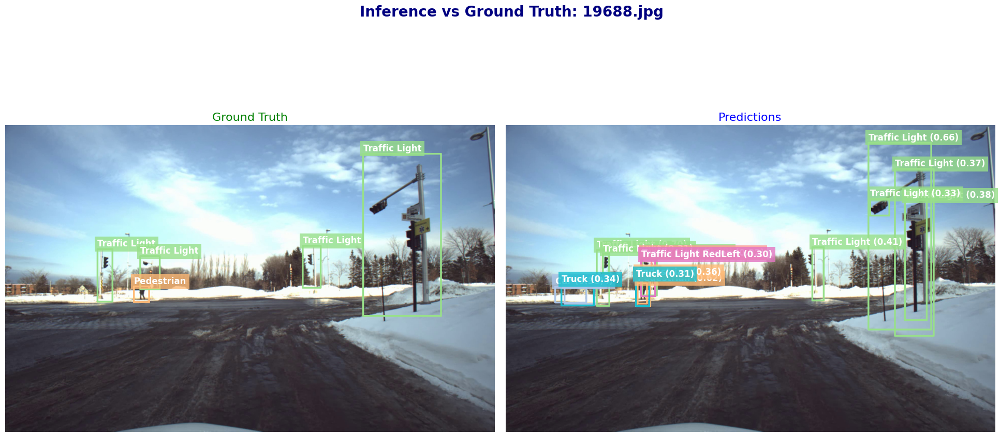

🔍 Predicting: 19390.jpg


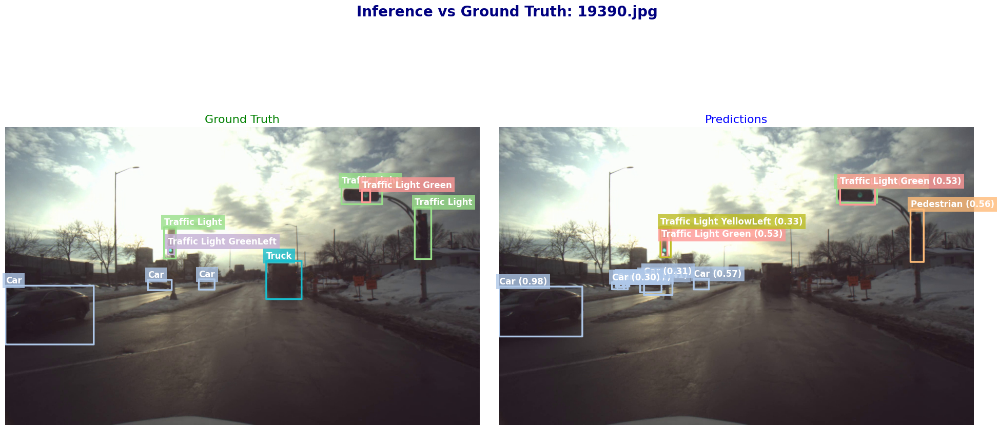

🔍 Predicting: 19401.jpg


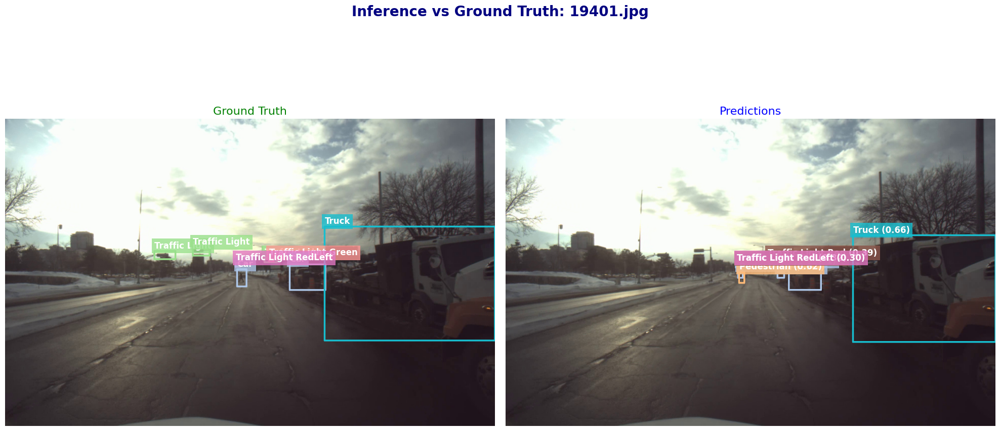

🔍 Predicting: 19487.jpg


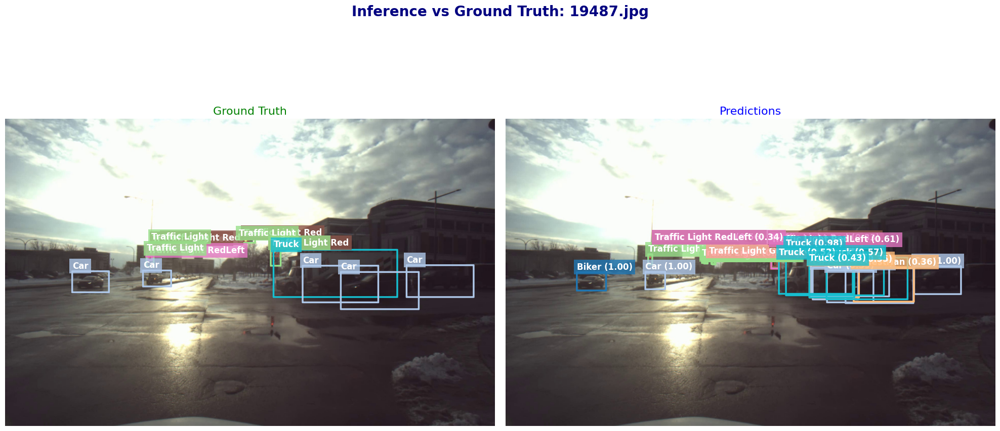

In [ ]:
import os
import cv2
import torch
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import cm
from torchvision import transforms


# Use GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Class name mappings
mappings = {
    0: 'Biker', 1: 'Car', 2: 'Pedestrian', 3: 'Traffic Light', 4: 'Traffic Light Green',
    5: 'Traffic Light GreenLeft', 6: 'Traffic Light Red', 7: 'Traffic Light RedLeft',
    8: 'Traffic Light Yellow', 9: 'Traffic Light YellowLeft', 10: 'Truck', 11: 'Arret'
}

# Color map for each class
cmap = cm.get_cmap('tab20', len(mappings))
label_colors = {k: cmap(k) for k in mappings}

def get_retinanet_model(num_classes):
    backbone = resnet_fpn_backbone('resnet18', pretrained=False)
    model = RetinaNet(backbone, num_classes=num_classes)
    return model

model_path = '/kaggle/input/m-retina/model_weights.pth'
model = get_retinanet_model(num_classes=12)
model.load_state_dict(torch.load(model_path, map_location=device))
model = model.to(device)
model.eval()

# Image transformation
transform = transforms.Compose([
    transforms.ToTensor(),
])

from torchvision.ops import nms

def infer_and_compare(model, image_path, labels_dir, score_thresh=0.7, iou_thresh=0.7):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Image not found: {image_path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_h, img_w, _ = img.shape
    input_tensor = transform(img_rgb).unsqueeze(0).to(device)

    with torch.no_grad():
        prediction = model(input_tensor)[0]

    pred_boxes = prediction['boxes'].cpu()
    pred_scores = prediction['scores'].cpu()
    pred_labels = prediction['labels'].cpu()

    # Apply score threshold
    keep = pred_scores > score_thresh
    pred_boxes = pred_boxes[keep]
    pred_scores = pred_scores[keep]
    pred_labels = pred_labels[keep]

    # Apply NMS per class
    final_boxes, final_scores, final_labels = [], [], []

    for cls in torch.unique(pred_labels):
        cls_mask = pred_labels == cls
        boxes_cls = pred_boxes[cls_mask]
        scores_cls = pred_scores[cls_mask]

        keep_indices = nms(boxes_cls, scores_cls, iou_thresh)

        final_boxes.append(boxes_cls[keep_indices])
        final_scores.append(scores_cls[keep_indices])
        final_labels.append(torch.full((len(keep_indices),), cls, dtype=torch.int64))

    if final_boxes:
        pred_boxes = torch.cat(final_boxes).numpy()
        pred_scores = torch.cat(final_scores).numpy()
        pred_labels = torch.cat(final_labels).numpy()
    else:
        pred_boxes = np.array([])
        pred_scores = np.array([])
        pred_labels = np.array([])

    # Load ground truth
    img_name = os.path.basename(image_path)
    label_path = os.path.join(labels_dir, os.path.splitext(img_name)[0] + ".txt")
    gt_boxes, gt_labels = [], []

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                class_id, cx, cy, w, h = map(float, parts)
                if class_id >= 12:
                    continue
                x1 = (cx - w / 2) * img_w
                y1 = (cy - h / 2) * img_h
                x2 = (cx + w / 2) * img_w
                y2 = (cy + h / 2) * img_h
                gt_boxes.append([x1, y1, x2, y2])
                gt_labels.append(int(class_id))

    # Plotting
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f"Inference vs Ground Truth: {img_name}", fontsize=20, color='navy', weight='bold')

    # Ground Truth
    axes[0].imshow(img_rgb)
    axes[0].set_title("Ground Truth", fontsize=16, color='green')
    for box, label in zip(gt_boxes, gt_labels):
        x1, y1, x2, y2 = box
        color = label_colors[label]
        rect = patches.FancyBboxPatch((x1, y1), x2 - x1, y2 - y1,
                                      linewidth=2.5, edgecolor=color,
                                      facecolor='none', boxstyle='round,pad=0.1')
        axes[0].add_patch(rect)
        axes[0].text(x1, y1 - 10, f'{mappings[label]}',
                     fontsize=12, color='white', backgroundcolor=color,
                     weight='bold', bbox=dict(facecolor=color, alpha=0.8, edgecolor='none'))
    axes[0].axis('off')

    # Predictions
    axes[1].imshow(img_rgb)
    axes[1].set_title("Predictions", fontsize=16, color='blue')
    for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
        x1, y1, x2, y2 = box
        color = label_colors.get(label, (0.7, 0.7, 0.7))
        rect = patches.FancyBboxPatch((x1, y1), x2 - x1, y2 - y1,
                                      linewidth=2.5, edgecolor=color,
                                      facecolor='none', boxstyle='round,pad=0.1')
        axes[1].add_patch(rect)
        axes[1].text(x1, y1 - 10, f'{mappings.get(label, str(label))} ({score:.2f})',
                     fontsize=12, color='white', backgroundcolor=color,
                     weight='bold', bbox=dict(facecolor=color, alpha=0.8, edgecolor='none'))
    axes[1].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()
    plt.close(fig)
    
# MAIN DRIVER
image_dir = '/kaggle/input/test-retina/test/test'
labels_dir = '/kaggle/input/test-retina/clean_label/clean_label'
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png'))]

random.shuffle(image_files)
selected_images = image_files[:20]

for img_file in selected_images:
    print(f"🔍 Predicting: {img_file}")
    infer_and_compare(
        model,
        os.path.join(image_dir, img_file),
        labels_dir=labels_dir,
        score_thresh=0.3
    )

In [39]:
import os
import cv2
import torch
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from matplotlib import cm
from matplotlib import patches
from torchvision import transforms

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Class mappings
mappings = {
    0: 'Biker', 1: 'Car', 2: 'Pedestrian', 3: 'Traffic Light', 4: 'Traffic Light Green',
    5: 'Traffic Light GreenLeft', 6: 'Traffic Light Red', 7: 'Traffic Light RedLeft',
    8: 'Traffic Light Yellow', 9: 'Traffic Light YellowLeft', 10: 'Truck', 11: 'Arret'
}

# Prediction function for YOLOS (if needed)
def predict_on_image(model, image_path, processor, score_thresh=0.5):
    img = cv2.imread(image_path)
    if img is None:
        return [], []
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_h, img_w, _ = img.shape

    inputs = processor(images=img_rgb, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)

    results = processor.post_process_object_detection(outputs, target_sizes=[(img_h, img_w)])[0]

    boxes = results["boxes"].cpu().numpy()
    labels = results["labels"].cpu().numpy()
    scores = results["scores"].cpu().numpy()

    filtered = scores > score_thresh
    boxes = boxes[filtered]
    labels = labels[filtered]
    scores = scores[filtered]

    pred = [(boxes[i], labels[i], scores[i]) for i in range(len(boxes))]
    return pred, (img_w, img_h)

# Ground truth loader
def load_ground_truth(label_path, img_w, img_h):
    gt = []
    if not os.path.exists(label_path):
        return gt
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            class_id, cx, cy, w, h = map(float, parts)
            if class_id >= 12:
                continue
            x1 = (cx - w / 2) * img_w
            y1 = (cy - h / 2) * img_h
            x2 = (cx + w / 2) * img_w
            y2 = (cy + h / 2) * img_h
            gt.append(([x1, y1, x2, y2], int(class_id)))
    return gt

# For RetinaNet predictions
def collect_all_results(model, image_dir, label_dir, score_thresh=0.3, limit=None):
    model = model.to(device)
    model.eval()
    transform = transforms.Compose([transforms.ToTensor()])

    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png'))]
    if limit:
        image_files = image_files[:limit]

    predictions = {}
    ground_truths = {}

    for img_file in image_files:
        img_path = os.path.join(image_dir, img_file)
        label_path = os.path.join(label_dir, os.path.splitext(img_file)[0] + '.txt')

        img = cv2.imread(img_path)
        if img is None:
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_tensor = transform(img_rgb).unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(img_tensor)[0]

        keep = output['scores'] > score_thresh
        pred = [
            (output['boxes'][i].cpu().numpy(), int(output['labels'][i]), float(output['scores'][i]))
            for i in range(len(output['scores'])) if keep[i]
        ]

        img_h, img_w = img.shape[:2]
        gt = load_ground_truth(label_path, img_w, img_h)

        predictions[img_file] = pred
        ground_truths[img_file] = gt

    return predictions, ground_truths

# IoU computation
def compute_iou(box1, box2):
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])
    inter_area = max(0, xB - xA) * max(0, yB - yA)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area > 0 else 0.0

# Evaluation

def evaluate_predictions(predictions, ground_truths, class_names, iou_thresh=0.5):
    class_stats = {c: {'TP': 0, 'FP': 0, 'FN': 0} for c in range(len(class_names))}

    for img_id in predictions:
        preds = predictions[img_id]
        gts = ground_truths.get(img_id, [])
        matched = set()
        for pred_box, pred_label, _ in preds:
            found_match = False
            for i, (gt_box, gt_label) in enumerate(gts):
                if i in matched or pred_label != gt_label:
                    continue
                if compute_iou(pred_box, gt_box) >= iou_thresh:
                    class_stats[pred_label]['TP'] += 1
                    matched.add(i)
                    found_match = True
                    break
            if not found_match:
                class_stats[pred_label]['FP'] += 1
        for i, (_, gt_label) in enumerate(gts):
            if i not in matched:
                class_stats[gt_label]['FN'] += 1

    metrics = defaultdict(dict)
    for c, stats in class_stats.items():
        TP, FP, FN = stats['TP'], stats['FP'], stats['FN']
        precision = TP / (TP + FP + 1e-6)
        recall = TP / (TP + FN + 1e-6)
        f1 = 2 * precision * recall / (precision + recall + 1e-6)
        metrics[c]['precision'] = precision
        metrics[c]['recall'] = recall
        metrics[c]['f1'] = f1
    return metrics

# Plotting

def plot_class_metrics(metrics, class_names):
    classes = [class_names[c] for c in metrics]
    precision = [metrics[c]['precision'] for c in metrics]
    recall = [metrics[c]['recall'] for c in metrics]
    f1 = [metrics[c]['f1'] for c in metrics]

    x = np.arange(len(classes))
    width = 0.25

    plt.figure(figsize=(14, 6))
    plt.bar(x - width, precision, width, label='Precision', color='skyblue')
    plt.bar(x, recall, width, label='Recall', color='lightgreen')
    plt.bar(x + width, f1, width, label='F1 Score', color='salmon')

    plt.xlabel("Class")
    plt.ylabel("Score")
    plt.title("Class-wise Precision, Recall, F1 Score")
    plt.xticks(x, classes, rotation=45, ha='right')
    plt.ylim([0, 1])
    plt.legend()
    plt.tight_layout()
    plt.show()


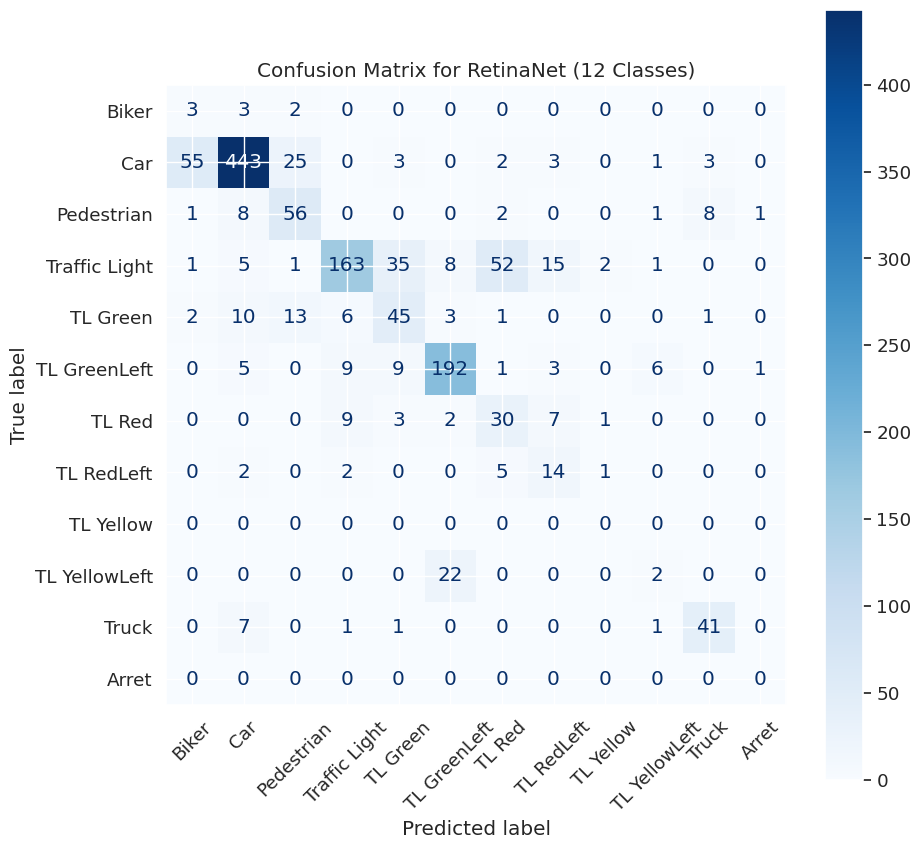

In [42]:
import torch
import numpy as np
import os
import cv2
from torchvision import transforms
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# --------- Initialize variables ----------
all_gt_labels = []
all_pred_labels = []

# --------- Constants ----------
NUM_CLASSES = 12  # No background class assumed
IOU_THRESHOLD = 0.3  # For matching boxes
SCORE_THRESHOLD = 0.3
image_dir = '/kaggle/input/test-retina/test/test'
labels_dir = '/kaggle/input/test-retina/clean_label/clean_label'
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png'))]

selected_images = image_files
# --------- Helper Functions ----------
def compute_iou(box1, box2):
    """Compute IoU between two boxes (x1, y1, x2, y2)."""
    x1, y1, x2, y2 = box1
    x1g, y1g, x2g, y2g = box2

    xi1 = max(x1, x1g)
    yi1 = max(y1, y1g)
    xi2 = min(x2, x2g)
    yi2 = min(y2, y2g)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)

    box_area = (x2 - x1) * (y2 - y1)
    gt_area = (x2g - x1g) * (y2g - y1g)
    union = box_area + gt_area - inter_area

    return inter_area / union if union > 0 else 0

# --------- Load Model ---------
# Use your already-loaded `model`, `device`, etc.

# --------- Transform ---------
transform = transforms.Compose([transforms.ToTensor()])

# --------- Process Images ----------
for img_file in selected_images:
    img_path = os.path.join(image_dir, img_file)
    label_path = os.path.join(labels_dir, os.path.splitext(img_file)[0] + ".txt")

    img = cv2.imread(img_path)
    if img is None or not os.path.exists(label_path):
        continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_h, img_w, _ = img.shape
    input_tensor = transform(img_rgb).unsqueeze(0).to(device)

    # Get predictions
    with torch.no_grad():
        prediction = model(input_tensor)[0]

    pred_boxes = prediction['boxes'].cpu()
    pred_scores = prediction['scores'].cpu()
    pred_labels = prediction['labels'].cpu()

    keep = pred_scores > SCORE_THRESHOLD
    pred_boxes = pred_boxes[keep].numpy()
    pred_labels = pred_labels[keep].numpy()

    # Get ground truth
    gt_boxes = []
    gt_labels = []

    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            class_id, cx, cy, w, h = map(float, parts)
            if class_id >= NUM_CLASSES:
                continue
            x1 = (cx - w / 2) * img_w
            y1 = (cy - h / 2) * img_h
            x2 = (cx + w / 2) * img_w
            y2 = (cy + h / 2) * img_h
            gt_boxes.append([x1, y1, x2, y2])
            gt_labels.append(int(class_id))

    matched_preds = set()
    matched_gts = set()

    for i, gt_box in enumerate(gt_boxes):
        best_iou = 0
        best_idx = -1
        for j, pred_box in enumerate(pred_boxes):
            if j in matched_preds:
                continue
            iou = compute_iou(gt_box, pred_box)
            if iou > best_iou:
                best_iou = iou
                best_idx = j

        if best_iou >= IOU_THRESHOLD and best_idx != -1:
            all_gt_labels.append(gt_labels[i])
            all_pred_labels.append(pred_labels[best_idx])
            matched_preds.add(best_idx)
            matched_gts.add(i)

    # Count false negatives (missed GT)
    for i in range(len(gt_boxes)):
        if i not in matched_gts:
            all_gt_labels.append(gt_labels[i])
            all_pred_labels.append(-1)  # predicted nothing

    # Count false positives (extra boxes)
    for j in range(len(pred_boxes)):
        if j not in matched_preds:
            all_gt_labels.append(-1)  # no ground truth
            all_pred_labels.append(pred_labels[j])

# --------- Confusion Matrix ---------
class_labels = list(range(NUM_CLASSES))
cm = confusion_matrix(all_gt_labels, all_pred_labels, labels=class_labels)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[
    'Biker', 'Car', 'Pedestrian', 'Traffic Light', 'TL Green',
    'TL GreenLeft', 'TL Red', 'TL RedLeft', 'TL Yellow', 'TL YellowLeft', 'Truck', 'Arret'
])
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(ax=ax, cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix for RetinaNet (12 Classes)")
plt.show()

In [44]:
# Calculate accuracy
correct_predictions = np.trace(cm)  # Sum of diagonal elements (true positives)
total_predictions = np.sum(cm)     # Sum of all elements in the matrix

accuracy = correct_predictions / total_predictions

print(f"Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")

Accuracy: 0.7267 (72.67%)


In [33]:
import numpy as np
import matplotlib.pyplot as plt

def compute_metrics_from_cm(cm):
    num_classes = cm.shape[0]
    precisions = []
    recalls = []
    f1s = []

    for i in range(num_classes):
        TP = cm[i, i]
        FP = cm[:, i].sum() - TP
        FN = cm[i, :].sum() - TP

        precision = TP / (TP + FP + 1e-6)
        recall = TP / (TP + FN + 1e-6)
        f1 = 2 * precision * recall / (precision + recall + 1e-6)

        precisions.append(precision)
        recalls.append(recall)
        f1s.append(f1)

    return precisions, recalls, f1s

def plot_metrics(precisions, recalls, f1s, class_names):
    x = np.arange(len(class_names))
    width = 0.25

    fig, ax = plt.subplots(figsize=(12, 6))
    ax.bar(x - width, precisions, width, label='Precision', color='skyblue')
    ax.bar(x, recalls, width, label='Recall', color='lightgreen')
    ax.bar(x + width, f1s, width, label='F1-score', color='salmon')

    ax.set_xlabel('Classes')
    ax.set_ylabel('Score')
    ax.set_title('Per-Class Precision, Recall, and F1-Score')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    ax.set_ylim(0, 1.05)
    ax.legend()
    ax.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

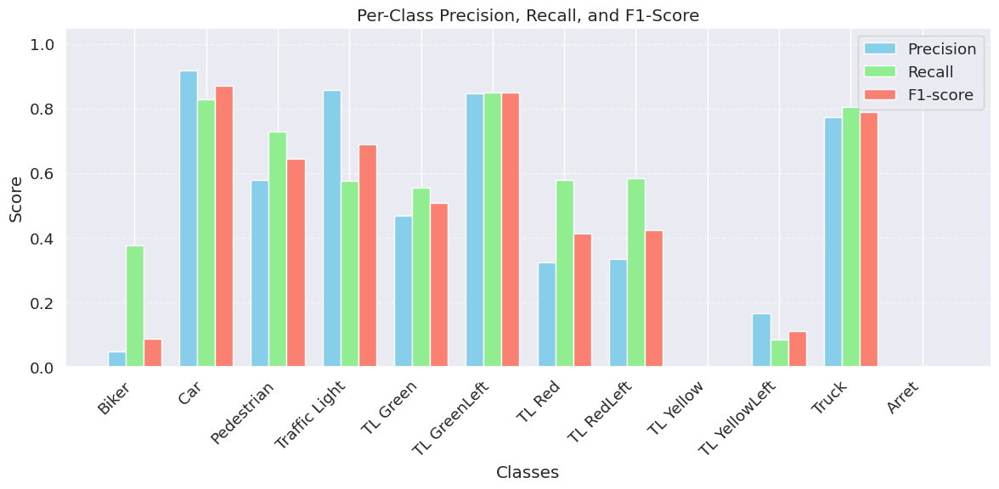

In [45]:
# Your 12-class label names
class_names = [
    'Biker', 'Car', 'Pedestrian', 'Traffic Light', 'TL Green',
    'TL GreenLeft', 'TL Red', 'TL RedLeft', 'TL Yellow',
    'TL YellowLeft', 'Truck', 'Arret'
]

# Make sure cm is 12x12
precisions, recalls, f1s = compute_metrics_from_cm(cm)
plot_metrics(precisions, recalls, f1s, class_names)

In [36]:
import numpy as np
from collections import defaultdict
from sklearn.metrics import average_precision_score

def compute_iou(boxA, boxB):
    """Compute IoU between two [x1, y1, x2, y2] boxes."""
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-6)
    return iou

def compute_map(predictions, ground_truths, num_classes=12, iou_threshold=0.5):
    """
    Compute class-wise AP and mean AP for object detection results.
    """
    all_scores = defaultdict(list)
    all_true = defaultdict(list)
    valid_classes = []

    for class_id in range(num_classes):
        total_gt = 0  # Count GT instances for this class across all images

        for image_id in predictions:
            pred_items = predictions[image_id]
            gt_items = ground_truths.get(image_id, [])

            gt_boxes_cls = [gt[0] for gt in gt_items if gt[1] == class_id]
            total_gt += len(gt_boxes_cls)
            matched_gt = [False] * len(gt_boxes_cls)

            preds_cls = [(box, score) for box, label, score in pred_items if label == class_id]
            preds_cls = sorted(preds_cls, key=lambda x: -x[1])  # sort by score desc

            for pred_box, score in preds_cls:
                ious = [compute_iou(pred_box, gt_box) for gt_box in gt_boxes_cls]
                max_iou = max(ious) if ious else 0
                max_idx = np.argmax(ious) if ious else -1

                if max_iou >= iou_threshold and max_idx != -1 and not matched_gt[max_idx]:
                    all_scores[class_id].append(score)
                    all_true[class_id].append(1)  # TP
                    matched_gt[max_idx] = True
                else:
                    all_scores[class_id].append(score)
                    all_true[class_id].append(0)  # FP

            # FN: unmatched ground truths
            for matched in matched_gt:
                if not matched:
                    all_scores[class_id].append(0.0)
                    all_true[class_id].append(1)  # FN as a missed positive

        if total_gt > 0:
            valid_classes.append(class_id)

    classwise_ap = []
    for class_id in range(num_classes):
        if class_id in valid_classes and any(all_true[class_id]):
            try:
                ap = average_precision_score(all_true[class_id], all_scores[class_id])
            except:
                ap = 0.0
        else:
            ap = 0.0
        classwise_ap.append(ap)

    # Mean AP only over classes that had GT annotations
    if valid_classes:
        mAP = np.mean([classwise_ap[i] for i in valid_classes])
    else:
        mAP = 0.0

    return {
        "classwise_ap": [round(ap, 4) for ap in classwise_ap],
        "mAP": round(mAP, 4)
    }

In [40]:

predictions, ground_truths = collect_all_results(model, image_dir, labels_dir)

results = compute_map(predictions, ground_truths, num_classes=12)

class_names = [
    'Biker', 'Car', 'Pedestrian', 'Traffic Light', 'TL Green',
    'TL GreenLeft', 'TL Red', 'TL RedLeft', 'TL Yellow',
    'TL YellowLeft', 'Truck', 'Arret'
]

print(f"\nMean Average Precision (mAP): {results['mAP']}")
for cls_name, ap in zip(class_names, results['classwise_ap']):
    print(f"{cls_name}: AP = {ap}")


Mean Average Precision (mAP): 0.4623
Biker: AP = 0.0477
Car: AP = 0.7366
Pedestrian: AP = 0.4872
Traffic Light: AP = 0.6201
TL Green: AP = 0.3992
TL GreenLeft: AP = 0.6637
TL Red: AP = 0.2971
TL RedLeft: AP = 0.2668
TL Yellow: AP = 0.0
TL YellowLeft: AP = 0.3979
Truck: AP = 0.707
Arret: AP = 0.0


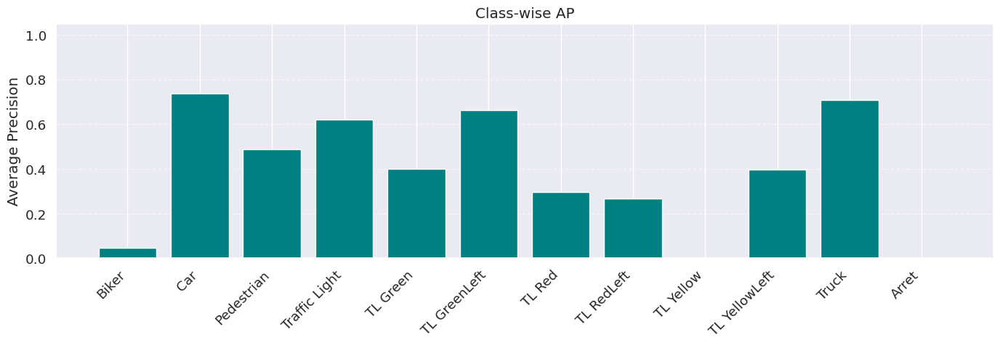

In [41]:
import matplotlib.pyplot as plt


plt.figure(figsize=(14, 5))
plt.bar(class_names, results['classwise_ap'], color='teal')
plt.ylabel('Average Precision')
plt.title('Class-wise AP')
plt.ylim(0, 1.05)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()